In [61]:
from utils import DQN, ReplayBuffer, greedy_action, epsilon_greedy, update_target, loss
from sklearn.model_selection import ParameterGrid
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import math
import numpy as np

import gym
import matplotlib.pyplot as plt
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(device)

# print(torch.cuda.get_device_name())
# # torch.cuda.set_device(0)



In [62]:
def update_epsilon(epsilon, decay_rate, min_epsilon):
    return max(min_epsilon, epsilon * decay_rate)
runs_results = []

# env = gym.make('CartPole-v1')
# for run in range(NUM_RUNS):
#     print(f"Starting run {run+1} of {NUM_RUNS}")
#     layers = [4] + [A]*B + [2]
#     policy_net = DQN(layers)
#     target_net = DQN(layers)
#     update_target(target_net, policy_net)
#     target_net.eval()

#     optimizer = optimizer = optim.SGD(policy_net.parameters(), lr=C) #For faster convergence, use Adam instead of SGD
#     memory = ReplayBuffer(D)

#     steps_done = 0

#     episode_durations = []

#     for i_episode in range(E):
#         if (i_episode+1) % 50 == 0:
#             print("episode ", i_episode+1, "/", 300)

#         observation, info = env.reset()
#         state = torch.tensor(observation).float()

#         done = False
#         terminated = False
#         t = 0
#         # F = F*0.99
#         # if F <= 0.01:
#         #     F = 0.01
            
#         while not (done or terminated):

#             # Select and perform an action
#             action = epsilon_greedy(F, policy_net, state)
            
#             observation, reward, done, terminated, info = env.step(action)
#             reward = torch.tensor([reward])/G
#             # reward = torch.tensor([reward]).to(device)/(1 + 100*state[2])
#             action = torch.tensor([action])
#             next_state = torch.tensor(observation).reshape(-1).float()

#             memory.push([state, action, next_state, reward, torch.tensor([done])])

#             # Move to the next state
#             state = next_state

#             # Perform one step of the optimization (on the policy network)
#             if not len(memory.buffer) < H:
#                 transitions = memory.sample(H)
#                 state_batch, action_batch, nextstate_batch, reward_batch, dones = (torch.stack(x) for x in zip(*transitions))
#                 # Compute loss
#                 mse_loss = loss(policy_net, target_net, state_batch, action_batch, reward_batch, nextstate_batch, dones)
#                 # Optimize the model
#                 optimizer.zero_grad()
#                 mse_loss.backward()
#                 optimizer.step()
            
#             if done or terminated:
#                 episode_durations.append(t + 1)
#             t += 1
#             steps_done += 1
            
#             # Update the target network, copying all weights and biases in DQN
#             if steps_done % I == 0: 
#                 update_target(target_net, policy_net)
            
#         F = update_epsilon(F, decay_rate, min_epsilon=0.01)
#         # F = glie_epsilon_decay(i_episode, start_epsilon=F, min_epsilon=0.01)
#     runs_results.append(episode_durations)
# print('Complete')

In [140]:
NUM_RUNS = 4
min_epsilon = 0.01
decay_rate = 0.995
runs_results = []
def run_training(params):
        env = gym.make('CartPole-v1')
        total_rewards = []

        for run in range(NUM_RUNS):
            layers = [4] + [params['A']] * params['B'] + [2]
            policy_net = DQN(layers)
            target_net = DQN(layers)
            update_target(target_net, policy_net)
            target_net.eval()

            optimizer = optim.SGD(policy_net.parameters(), lr=params['C'])
            memory = ReplayBuffer(params['D'])

            steps_done = 0
            episode_durations = []

            for i_episode in range(params['E']):
                observation, info = env.reset()
                state = torch.tensor(observation).float()

                done = False
                terminated = False
                t = 0

                while not (done or terminated):
                    action = epsilon_greedy(params['F'], policy_net, state)
                    observation, reward, done, terminated, info = env.step(action)
                    reward = torch.tensor([reward]) / params['G']
                    action = torch.tensor([action])
                    next_state = torch.tensor(observation).reshape(-1).float()

                    memory.push([state, action, next_state, reward, torch.tensor([done])])
                    state = next_state

                    if not len(memory.buffer) < params['H']:
                        transitions = memory.sample(params['H'])
                        state_batch, action_batch, nextstate_batch, reward_batch, dones = (torch.stack(x) for x in zip(*transitions))
                        mse_loss = loss(policy_net, target_net, state_batch, action_batch, reward_batch, nextstate_batch, dones)
                        optimizer.zero_grad()
                        mse_loss.backward()
                        optimizer.step()

                    if done or terminated:
                        episode_durations.append(t + 1)
                    t += 1
                    steps_done += 1


                    if steps_done % params['I'] == 0:
                        update_target(target_net, policy_net)

                params['F'] = update_epsilon(params['F'], decay_rate, min_epsilon)
            
            runs_results.append(episode_durations)
        results = torch.tensor(runs_results)
        means = results.float().mean(0)
        print(f"max_Mean: {means.max().item()}")
        count_greater_than_100 = (means > 100).sum().item()
        print(f"Count greater than 100: {count_greater_than_100}")
        return count_greater_than_100

In [141]:
import optuna
from optuna.samplers import RandomSampler

NUM_RUNS = 4

# # Clarify that all nine hyperparameters A to I should be reported in question 1.1.
# A = 64 # Number of neurons in each hidden layer of the DQN.
# B = 2 # Number of hidden layers
# C = 0.0025 # Learning rate
# D = 10000 # Replay buffer size
# E = 300 # Number of episodes
# F = 0.5 # Epsilon for epsilon-greedy action selection eps_start = 0.9, eps_end = 0.1
# G = 2# Reward scaling factor
# H = 128 # Batch size for replay buffer sampling 128
# I = 60 # Target network update frequency (in steps)

min_epsilon = 0.01
decay_rate = 0.995
# # epsilon_start = F
# # epsilon_end = 0.01
# # epsilon_decay = 0.995

# Define the parameter grid
# param_grid = {
#     'A': [16, 32, 64, 128, 256],  # Number of neurons in each hidden layer of the DQN
#     'B': [2, 3],      # Number of hidden layers
#     'C': [0.001, 0.0025, 0.01],  # Learning rate
#     'D': [400, 600, 800, 1000, 1200],    # Replay buffer size
#     'E': [300],         # Number of episodes
#     'F': [0.2, 0.3, 0.4, 0.5, 0.9],         # Epsilon for epsilon-greedy action selection
#     'G': [1, 2, 5],               # Reward scaling factor
#     'H': [32, 64, 128, 256],          # Batch size for replay buffer sampling
#     'I': [40, 60, 80, 100, 120, 140]            # Target network update frequency (in steps)
# }

def objective(trial):
    params = {
        'A': trial.suggest_categorical('A', [32, 64, 128]),
        'B': trial.suggest_categorical('B', [1, 2, 3]),  
        'C': 0.01,
        'D': 600,
        'E': 300,  # Fixed value
        'F': trial.suggest_categorical('F', [0.3, 0.4]),
        'G': trial.suggest_categorical('G', [1, 2, 5]),
        'H': trial.suggest_categorical('H', [64, 128, 256]),
        'I': trial.suggest_int('I', 60, 100, step=20)
    }
    return run_training(params)

    

study = optuna.create_study(study_name="DeepQlearning", direction="maximize", sampler=RandomSampler())
study.optimize(objective, n_trials=40)

best_params = study.best_params
best_reward = study.best_value

print("Best Parameters:", best_params)
print("Best Average Reward:", best_reward)

# By exploration strategy they mean epsilon decay, alpha decay etc.

[I 2024-11-16 15:04:20,650] A new study created in memory with name: DeepQlearning
[I 2024-11-16 15:06:05,980] Trial 0 finished with value: 9.0 and parameters: {'A': 64, 'B': 1, 'F': 0.4, 'G': 2, 'H': 256, 'I': 60}. Best is trial 0 with value: 9.0.


max_Mean: 140.0
Count greater than 100: 9


[I 2024-11-16 15:07:32,641] Trial 1 finished with value: 1.0 and parameters: {'A': 64, 'B': 2, 'F': 0.3, 'G': 5, 'H': 128, 'I': 100}. Best is trial 0 with value: 9.0.


max_Mean: 112.75
Count greater than 100: 1


[I 2024-11-16 15:09:24,275] Trial 2 finished with value: 0.0 and parameters: {'A': 32, 'B': 3, 'F': 0.4, 'G': 5, 'H': 256, 'I': 100}. Best is trial 0 with value: 9.0.


max_Mean: 87.83333587646484
Count greater than 100: 0


[I 2024-11-16 15:12:05,915] Trial 3 finished with value: 0.0 and parameters: {'A': 64, 'B': 3, 'F': 0.4, 'G': 2, 'H': 128, 'I': 100}. Best is trial 0 with value: 9.0.


max_Mean: 89.5
Count greater than 100: 0


[I 2024-11-16 15:13:19,828] Trial 4 finished with value: 0.0 and parameters: {'A': 32, 'B': 3, 'F': 0.4, 'G': 1, 'H': 64, 'I': 60}. Best is trial 0 with value: 9.0.


max_Mean: 73.94999694824219
Count greater than 100: 0


[I 2024-11-16 15:14:49,713] Trial 5 finished with value: 0.0 and parameters: {'A': 128, 'B': 1, 'F': 0.4, 'G': 5, 'H': 128, 'I': 60}. Best is trial 0 with value: 9.0.


max_Mean: 81.75
Count greater than 100: 0


[I 2024-11-16 15:17:10,377] Trial 6 finished with value: 1.0 and parameters: {'A': 64, 'B': 1, 'F': 0.3, 'G': 2, 'H': 128, 'I': 60}. Best is trial 0 with value: 9.0.


max_Mean: 101.85713958740234
Count greater than 100: 1


[I 2024-11-16 15:20:54,885] Trial 7 finished with value: 1.0 and parameters: {'A': 64, 'B': 2, 'F': 0.4, 'G': 1, 'H': 256, 'I': 80}. Best is trial 0 with value: 9.0.


max_Mean: 108.90625
Count greater than 100: 1


[I 2024-11-16 15:23:41,919] Trial 8 finished with value: 2.0 and parameters: {'A': 64, 'B': 1, 'F': 0.4, 'G': 1, 'H': 128, 'I': 100}. Best is trial 0 with value: 9.0.


max_Mean: 109.22222137451172
Count greater than 100: 2


[I 2024-11-16 15:25:57,394] Trial 9 finished with value: 0.0 and parameters: {'A': 128, 'B': 3, 'F': 0.3, 'G': 1, 'H': 128, 'I': 100}. Best is trial 0 with value: 9.0.


max_Mean: 99.80000305175781
Count greater than 100: 0


[W 2024-11-16 15:27:17,441] Trial 10 failed with parameters: {'A': 64, 'B': 2, 'F': 0.4, 'G': 5, 'H': 256, 'I': 80} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "c:\Users\SUNITA\anaconda3\envs\pytorch\Lib\site-packages\optuna\study\_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\SUNITA\AppData\Local\Temp\ipykernel_21448\2853978370.py", line 48, in objective
    return run_training(params)
           ^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\SUNITA\AppData\Local\Temp\ipykernel_21448\3011183768.py", line 42, in run_training
    state_batch, action_batch, nextstate_batch, reward_batch, dones = (torch.stack(x) for x in zip(*transitions))
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\SUNITA\AppData\Local\Temp\ipykernel_21448\3011183768.py", line 42, in <genexpr>
    state_batch, action_batch, nextstate_batch, reward_batch, dones = (

KeyboardInterrupt: 

In [ ]:
print("Best Parameters:", best_params)
print("Best Average Reward:", best_reward)

Best Parameters: {'A': 16, 'B': 2, 'C': 0.001, 'D': 400, 'E': 300, 'F': 0.2, 'G': 1, 'H': 32, 'I': 40}
Best Average Reward: 0


In [63]:
NUM_RUNS = 10 # Final Hyperparameters

# Clarify that all nine hyperparameters A to I should be reported in question 1.1.
A = 32 # Number of neurons in each hidden layer of the DQN.
B = 2 # Number of hidden layers
C = 0.001 # Learning rate
D = 600 # Replay buffer size
E = 300 # Number of episodes
F = 0.2 # Epsilon for epsilon-greedy action selection eps_start = 0.9, eps_end = 0.1
G = 1# Reward scaling factor
H = 256 # Batch size for replay buffer sampling 128
I = 100 # Target network update frequency (in steps)


min_epsilon = 0.01
decay_rate = 0.995

In [64]:
# Achieving an agent that reaches an
# average reward of 100 over 10 runs of training for over 50 episodes will grant you full performance
# marks
# For full performance marks, the
# final learning curve should consistently achieve an average episode length of 100, by achieving such a
# target for at least 50 consecutive episodes (that is good enough).
# GLIE (Greedy in the Limit with Infinite Exploration) epsilon decay
# start_epsilon = 1.0
# Update epsilon using decay rate
def update_epsilon(epsilon, decay_rate, min_epsilon):
    return max(min_epsilon, epsilon * decay_rate)

def glie_epsilon_decay(episode, start_epsilon=1.0, min_epsilon=0.01):
    return max(min_epsilon, start_epsilon / (episode + 1))



In [65]:
runs_results = []
policy_list = []
target_list = []

env = gym.make('CartPole-v1')
for run in range(NUM_RUNS):
    print(f"Starting run {run+1} of {NUM_RUNS}")
    layers = [4] + [A]*B + [2]
    policy_net = DQN(layers)
    target_net = DQN(layers)
    update_target(target_net, policy_net)
    target_net.eval()

    optimizer = optimizer = optim.Adam(policy_net.parameters(), lr=C) #For faster convergence, use Adam instead of SGD
    memory = ReplayBuffer(D)

    steps_done = 0

    episode_durations = []

    for i_episode in range(E):
        if (i_episode+1) % 50 == 0:
            print("episode ", i_episode+1, "/", 300) #300

        observation, info = env.reset()
        state = torch.tensor(observation).float()

        done = False
        terminated = False
        t = 0
        # F = F*0.99
        # if F <= 0.01:
        #     F = 0.01
            
        while not (done or terminated):

            # Select and perform an action
            action = epsilon_greedy(F, policy_net, state)
            
            observation, reward, done, terminated, info = env.step(action)
            reward = torch.tensor([reward])/G
            # reward = torch.tensor([reward]).to(device)/(1 + 100*state[2])
            action = torch.tensor([action])
            next_state = torch.tensor(observation).reshape(-1).float()

            memory.push([state, action, next_state, reward, torch.tensor([done])])

            # Move to the next state
            state = next_state

            # Perform one step of the optimization (on the policy network)
            if not len(memory.buffer) < H:
                transitions = memory.sample(H)
                state_batch, action_batch, nextstate_batch, reward_batch, dones = (torch.stack(x) for x in zip(*transitions))
                # Compute loss
                mse_loss = loss(policy_net, target_net, state_batch, action_batch, reward_batch, nextstate_batch, dones)
                # Optimize the model
                optimizer.zero_grad()
                mse_loss.backward()
                optimizer.step()
            
            if done or terminated:
                episode_durations.append(t + 1)
            t += 1
            steps_done += 1
            
            # Update the target network, copying all weights and biases in DQN
            if steps_done % I == 0: 
                update_target(target_net, policy_net)
            
        F = update_epsilon(F, decay_rate, min_epsilon=0.01)
        # print("steps_t", t) 
        # F = glie_epsilon_decay(i_episode, start_epsilon=F, min_epsilon=0.01)
    runs_results.append(episode_durations)

    policy_list.append(policy_net)
    target_list.append(target_net)
    
    print("steps_done", steps_done)
print('Complete')

Starting run 1 of 10


c:\Users\SUNITA\anaconda3\envs\pytorch\Lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 81855
Starting run 2 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 37069
Starting run 3 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 71038
Starting run 4 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 65935
Starting run 5 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 37929
Starting run 6 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300
episode  300 / 300
steps_done 51838
Starting run 7 of 10
episode  50 / 300
episode  100 / 300
episode  150 / 300
episode  200 / 300
episode  250 / 300


In [44]:
print("Policy List", policy_list)

Policy List [DQN(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): Linear(in_features=32, out_features=2, bias=True)
  )
), DQN(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): Linear(in_features=32, out_features=2, bias=True)
  )
), DQN(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): Linear(in_features=32, out_features=2, bias=True)
  )
), DQN(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): Linear(in_features=32, out_features=2, bias=True)
  )
), DQN(
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_feature

In [45]:
print("runs_results", runs_results[6])
# print(policy_list)

runs_results [11, 10, 8, 10, 9, 9, 8, 8, 10, 10, 9, 10, 10, 9, 9, 8, 9, 9, 9, 9, 10, 9, 8, 10, 10, 10, 10, 11, 10, 10, 10, 10, 9, 9, 10, 8, 9, 10, 10, 10, 10, 9, 9, 10, 10, 10, 10, 11, 9, 9, 8, 13, 9, 10, 10, 10, 9, 8, 9, 10, 8, 15, 8, 9, 9, 17, 9, 10, 10, 10, 10, 11, 8, 11, 46, 14, 16, 49, 23, 26, 19, 23, 36, 35, 21, 33, 37, 23, 36, 38, 69, 39, 64, 36, 84, 140, 350, 254, 185, 205, 207, 187, 219, 264, 174, 145, 149, 147, 163, 150, 173, 150, 154, 156, 155, 146, 149, 167, 169, 144, 135, 150, 141, 147, 151, 162, 146, 175, 164, 168, 177, 171, 183, 187, 307, 500, 337, 25, 14, 14, 10, 12, 14, 14, 13, 10, 8, 11, 9, 10, 11, 9, 9, 9, 10, 10, 9, 9, 10, 10, 9, 12, 33, 117, 264, 174, 212, 173, 140, 121, 110, 113, 111, 100, 109, 115, 116, 108, 116, 99, 102, 91, 23, 15, 16, 15, 27, 112, 179, 113, 110, 153, 115, 247, 310, 322, 216, 329, 435, 344, 177, 317, 158, 184, 133, 151, 134, 150, 133, 190, 200, 234, 200, 249, 160, 147, 158, 168, 167, 169, 167, 165, 161, 172, 167, 189, 183, 158, 221, 276, 226, 1

avg 272.85
max 500
mean tensor([ 12.2000,  11.6000,  12.0000,  11.4000,  12.6000,  11.3000,  10.6000,
         10.7000,  11.4000,   9.7000,   9.9000,   9.5000,   9.6000,   9.4000,
          9.6000,   8.9000,   9.4000,  12.5000,   9.5000,   9.5000,   9.7000,
          9.5000,  12.5000,   9.4000,   8.8000,   8.9000,   9.7000,   9.5000,
          9.5000,   9.7000,  10.7000,   9.6000,   9.6000,   9.6000,   9.4000,
          9.8000,   9.4000,   9.4000,   9.3000,   9.1000,   9.4000,   9.3000,
          8.9000,   9.8000,   9.0000,  10.1000,   9.6000,  10.2000,  13.6000,
         10.2000,  13.2000,  10.8000,  11.4000,  13.4000,  12.9000,  13.5000,
         13.3000,  10.9000,  19.1000,  18.2000,  16.1000,  22.3000,  16.2000,
         23.8000,  35.0000,  24.4000,  39.8000,  61.3000,  45.9000,  47.0000,
         42.4000,  47.5000,  43.4000,  42.0000,  44.6000,  43.4000,  40.0000,
         49.1000,  34.2000,  43.2000,  52.6000,  51.0000,  61.2000,  58.1000,
         67.4000,  73.6000,  74.7000,  8

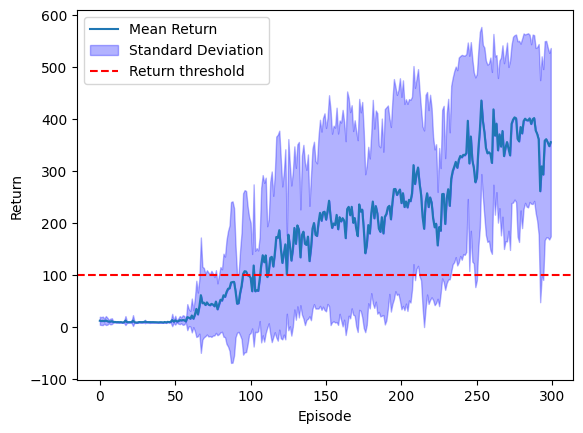

In [66]:
# Plotting the learning curve
# Placeholder plot, you are free to modify it

num_episodes = len(runs_results[0])

# print("num_episodes", num_episodes)

print("avg", np.mean(runs_results[0]))

print("max", max(runs_results[-1]))
 
results = torch.tensor(runs_results)
means = results.float().mean(0)
stds = results.float().std(0)
print("mean", means)
plt.plot(torch.arange(num_episodes), means, label='Mean Return')
plt.ylabel("Return")
plt.xlabel("Episode")
plt.fill_between(np.arange(num_episodes), means, means+stds, alpha=0.3, color='b', label='Standard Deviation')
plt.fill_between(np.arange(num_episodes), means, means-stds, alpha=0.3, color='b')
plt.axhline(y=100, color='r', linestyle='--', label='Return threshold')
plt.legend()
plt.show()

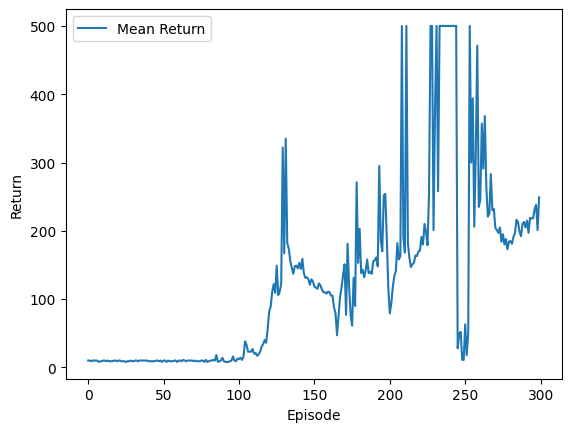

In [79]:
num_episodes = len(runs_results[0])

# print("num_episodes", num_episodes)

# print("avg", np.mean(runs_results[0]))

# print("max", max(runs_results[-1]))
 
results = torch.tensor(runs_results[7])
# means = results.float().mean(0)
# stds = results.float().std(0)

plt.plot(torch.arange(num_episodes), results, label='Mean Return')
plt.ylabel("Return")
plt.xlabel("Episode")
# plt.fill_between(np.arange(num_episodes), means, means+stds, alpha=0.3, color='b', label='Standard Deviation')
# plt.fill_between(np.arange(num_episodes), means, means-stds, alpha=0.3, color='b')
# plt.axhline(y=100, color='r', linestyle='--', label='Return threshold')
plt.legend()
plt.show()

In [72]:
torch.save(policy_list[2].state_dict(), 'policy_netv4_2.pth')

In [81]:
import torch
import matplotlib.pyplot as plt

# Assuming `policy_net` is your trained DQN model
# layers = [4] + [A]*B + [2]
# # policy_net = DQN(layers)  # Load your trained model here policy_list[2]
curr_policy = policy_list[2] #1, 5, 9
# Define ranges for the pole angle and angular velocity
angle_range = 0.2095  # Maximum angle in radians (approx 24 degrees) 0.418
omega_range = 1     # Maximum angular velocity

# Number of samples for angle and angular velocity
angle_samples = 100
omega_samples = 100

angles = torch.linspace(-angle_range, angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

# Fix the cart position and visualize for different cart velocities
cart_velocities = [0, 0.5, 1, 2]

index_num = ["i", "ii", "iii", "iv"]
# Create a 2x2 grid for subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10), dpi=600)
axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

for idx, cart_velocity in enumerate(cart_velocities):
    # Array to store the greedy policy (action) for each (angle, omega) pair
    policy_array = torch.zeros((angle_samples, omega_samples))
    
    # Evaluate the greedy policy
    for i, angle in enumerate(angles):
        for j, omega in enumerate(omegas):
            state = torch.tensor([0., cart_velocity, angle, omega])
            # print("state", state)
            with torch.no_grad():
                q_vals = curr_policy(state)
                # print("q_vals", q_vals)
                greedy_action = q_vals.argmax()
                #print("greedy_action", greedy_action)
                policy_array[i, j] = greedy_action
    
    # Plot the greedy policy for the current cart velocity
    ax = axes[idx]
    contour = ax.contourf(angles, omegas, policy_array.T, cmap='cividis')
    ax.set_title(f"({index_num[idx]}) Greedy Policy (Cart Velocity = {cart_velocity} m/s)", fontweight='bold', fontsize=14)
    ax.set_xlabel("Pole Angle (radians)", fontweight='bold', fontsize=14)
    ax.set_ylabel("Angular Velocity (rad/s)", fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=13)
    # Add a color bar to specify action meanings
    cbar = plt.colorbar(contour, ax=ax)
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Push Left (Blue)', 'Push Right (Yellow)'], fontweight='bold', fontsize=14)

# Adjust layout for better spacing
plt.subplots_adjust(hspace=0.25, wspace=0.25)
plt.tight_layout()
plt.show()

In [37]:
# Define ranges for the pole angle and angular velocity
angle_range = 0.2095  # Maximum angle in radians (approx 24 degrees)
omega_range = 1     # Maximum angular velocity

# Number of samples for angle and angular velocity
angle_samples = 100
omega_samples = 100

angles = torch.linspace(-angle_range, angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

# Fix the cart position and visualize for different cart velocities
cart_velocities = [0, 0.5, 1, 2]

index_num = ["i", "ii", "iii", "iv"]
# Create a 2x2 grid for subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10), dpi=600)
axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

for idx, cart_velocity in enumerate(cart_velocities):
    # Array to store the greedy Q-values for each (angle, omega) pair
    q_value_array = torch.zeros((angle_samples, omega_samples))
    greedy_q_array = torch.zeros((angle_samples, omega_samples))
    # Evaluate the greedy Q-values
    for i, angle in enumerate(angles):
        for j, omega in enumerate(omegas):
            state = torch.tensor([0., cart_velocity, angle, omega])
            with torch.no_grad():
                q_vals = curr_policy(state)
                greedy_action = q_vals.argmax()
                greedy_q_array[i, j] = q_vals[greedy_action]
                #q_value_array[i, j] = q_vals[greedy_action]
    
    # Plot the greedy Q-values for the current cart velocity
    ax = axes[idx]
    contour = ax.contourf(angles, omegas, greedy_q_array.T, cmap='cividis', levels=100)
    ax.set_title(f"({index_num[idx]}) Greedy Q-values (Cart Velocity = {cart_velocity} m/s)", fontweight='bold', fontsize=14)
    ax.set_xlabel("Pole Angle (radians)", fontweight='bold', fontsize=14)
    ax.set_ylabel("Angular Velocity (rad/s)", fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=14)
    # Add a color bar to specify Q-value meanings
    cbar = plt.colorbar(contour, ax=ax)
    cbar.set_label('Greedy Q-values', fontweight='bold', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    cbar.set_label('Greedy Q-values', labelpad=15)

# Adjust layout for better spacing
plt.subplots_adjust(hspace=0.25, wspace=0.25)
plt.tight_layout()
plt.show()

In [31]:
torch.save(policy_list[2].state_dict(), 'policy_netv2_2.pth')

In [3]:
state_dict = policy_list[7].state_dict()
for param_tensor in state_dict:
    print(f"{param_tensor}:\n{state_dict[param_tensor]}\n")

NameError: name 'policy_list' is not defined

In [119]:
curr_policy = policy_list[7]

avg 221.28666666666666
max 500
mean tensor([  9.3000,  10.1000,   9.9000,   9.5000,   9.2000,   9.8000,   9.4000,
         10.1000,   9.3000,   9.3000,   9.2000,   9.9000,   9.2000,  10.0000,
          9.5000,   9.8000,   9.8000,  10.0000,   9.4000,   9.8000,   9.5000,
         10.2000,   9.4000,   9.4000,   9.2000,   9.6000,   9.9000,   9.6000,
          9.7000,   9.0000,   9.7000,  10.0000,   9.4000,   9.7000,   9.4000,
          9.3000,   9.6000,  10.0000,   9.1000,   9.1000,   9.5000,  10.2000,
          9.5000,   9.5000,   9.6000,   9.8000,  10.0000,   9.5000,  10.6000,
         10.2000,  11.2000,  12.3000,   9.2000,  10.6000,  10.1000,  10.6000,
          9.2000,   9.9000,  10.3000,   9.8000,   9.8000,   9.4000,   9.5000,
          9.7000,  10.3000,  14.8000,   9.6000,  13.2000,  12.2000,  11.2000,
         10.4000,  11.4000,  16.5000,  12.0000,  11.0000,  12.4000,  13.0000,
         14.8000,  11.7000,  10.5000,  13.7000,  15.0000,  16.5000,  19.2000,
         18.8000,  22.9000, 

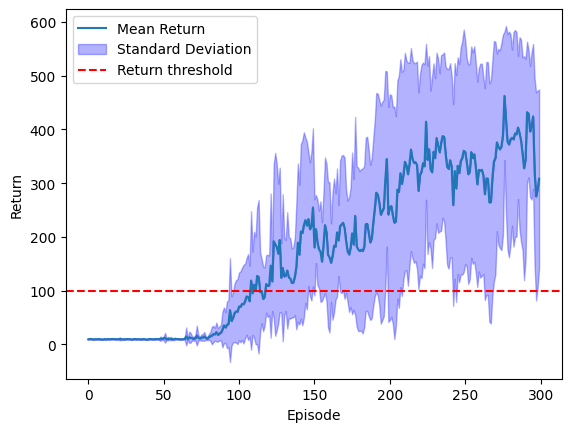

In [128]:
# Plotting the learning curve
# Placeholder plot, you are free to modify it

num_episodes = len(runs_results[0])

# print("num_episodes", num_episodes)

print("avg", np.mean(runs_results[0]))

print("max", max(runs_results[-1]))
 
results = torch.tensor(runs_results)
means = results.float().mean(0)
stds = results.float().std(0)
print("mean", means)
plt.plot(torch.arange(num_episodes), means, label='Mean Return')
plt.ylabel("Return")
plt.xlabel("Episode")
plt.fill_between(np.arange(num_episodes), means, means+stds, alpha=0.3, color='b', label='Standard Deviation')
plt.fill_between(np.arange(num_episodes), means, means-stds, alpha=0.3, color='b')
plt.axhline(y=100, color='r', linestyle='--', label='Return threshold')
plt.legend()
plt.show()

mean tensor([  9.3000,  10.1000,   9.9000,   9.5000,   9.2000,   9.8000,   9.4000,
         10.1000,   9.3000,   9.3000,   9.2000,   9.9000,   9.2000,  10.0000,
          9.5000,   9.8000,   9.8000,  10.0000,   9.4000,   9.8000,   9.5000,
         10.2000,   9.4000,   9.4000,   9.2000,   9.6000,   9.9000,   9.6000,
          9.7000,   9.0000,   9.7000,  10.0000,   9.4000,   9.7000,   9.4000,
          9.3000,   9.6000,  10.0000,   9.1000,   9.1000,   9.5000,  10.2000,
          9.5000,   9.5000,   9.6000,   9.8000,  10.0000,   9.5000,  10.6000,
         10.2000,  11.2000,  12.3000,   9.2000,  10.6000,  10.1000,  10.6000,
          9.2000,   9.9000,  10.3000,   9.8000,   9.8000,   9.4000,   9.5000,
          9.7000,  10.3000,  14.8000,   9.6000,  13.2000,  12.2000,  11.2000,
         10.4000,  11.4000,  16.5000,  12.0000,  11.0000,  12.4000,  13.0000,
         14.8000,  11.7000,  10.5000,  13.7000,  15.0000,  16.5000,  19.2000,
         18.8000,  22.9000,  17.5000,  20.3000,  21.8000,  

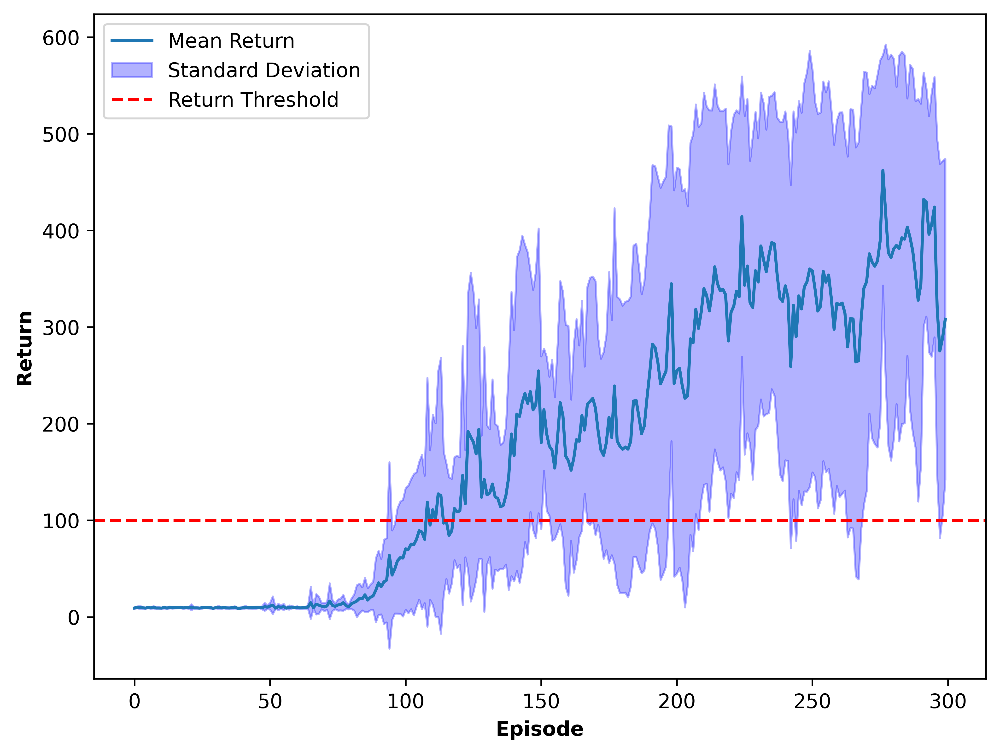

In [134]:
# Plotting the learning curve
# Placeholder plot, you are free to modify it

num_episodes = len(runs_results[0])

# print("num_episodes", num_episodes)

# print("avg", np.mean(runs_results[0]))

# print("max", max(runs_results[-1]))
 
results = torch.tensor(runs_results)
means = results.float().mean(0)
stds = results.float().std(0)
print("mean", means)
plt.figure(figsize=(8, 6), dpi=600)
plt.plot(torch.arange(num_episodes), means, label='Mean Return')
plt.ylabel("Return", fontweight='bold')
plt.xlabel("Episode", fontweight='bold')
plt.fill_between(np.arange(num_episodes), means, means+stds, alpha=0.3, color='b', label='Standard Deviation')
plt.fill_between(np.arange(num_episodes), means, means-stds, alpha=0.3, color='b')
plt.axhline(y=100, color='r', linestyle='--', label='Return Threshold')
plt.legend()
plt.show()

In [8]:
layers = [4] + [A]*B + [2]

load_policy = DQN(layers)

# Load the trained model's state dictionary
load_policy.load_state_dict(torch.load('policy_net.pth'))

# Set the model to evaluation mode
load_policy.eval()

state_dict1 = load_policy.state_dict()

# Print the weights and biases
for param_tensor in state_dict1:
    print(f"{param_tensor}:\n{state_dict1[param_tensor]}\n")

layers.0.weight:
tensor([[ 0.6453, -0.3254, -0.5052, -0.3187],
        [ 0.1799, -0.4016, -1.2331, -0.1406],
        [ 1.1223, -0.2845, -3.5265, -0.6117],
        [-1.0787, -1.0323, -2.6637, -0.6955],
        [ 0.5906, -0.2641, -0.4709, -0.1641],
        [ 0.1139, -0.4083, -0.2896, -0.2733],
        [ 0.7793, -0.6493, -0.9683, -0.4720],
        [ 1.5356,  0.9650,  0.9633,  0.6442],
        [-0.3811,  0.9142,  2.5810,  0.7878],
        [ 0.5439, -0.5777, -1.1541, -0.5063],
        [-0.1056, -0.6479,  1.6690,  0.5028],
        [ 1.3472,  0.1829,  0.1241,  0.0955],
        [ 0.3589,  0.4331, -0.3388,  0.2165],
        [ 0.1783,  0.0178, -0.4938,  0.0208],
        [ 0.4751, -0.4054, -0.8631, -0.3498],
        [ 0.3380, -0.4489, -1.6093, -0.1136],
        [ 0.0499, -0.0831,  0.1494, -0.4764],
        [-1.0552, -0.9807, -1.9531, -0.8675],
        [ 0.2936, -0.5353,  0.3269, -0.1646],
        [ 0.2323, -0.5962, -1.4158, -0.3823],
        [-0.0463,  0.0074,  0.5171, -0.4223],
        [ 0.3357,

C:\Users\SUNITA\AppData\Local\Temp\ipykernel_11184\2019068301.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  load_policy.load_state_dict(torch.load('policy_net.pth'))


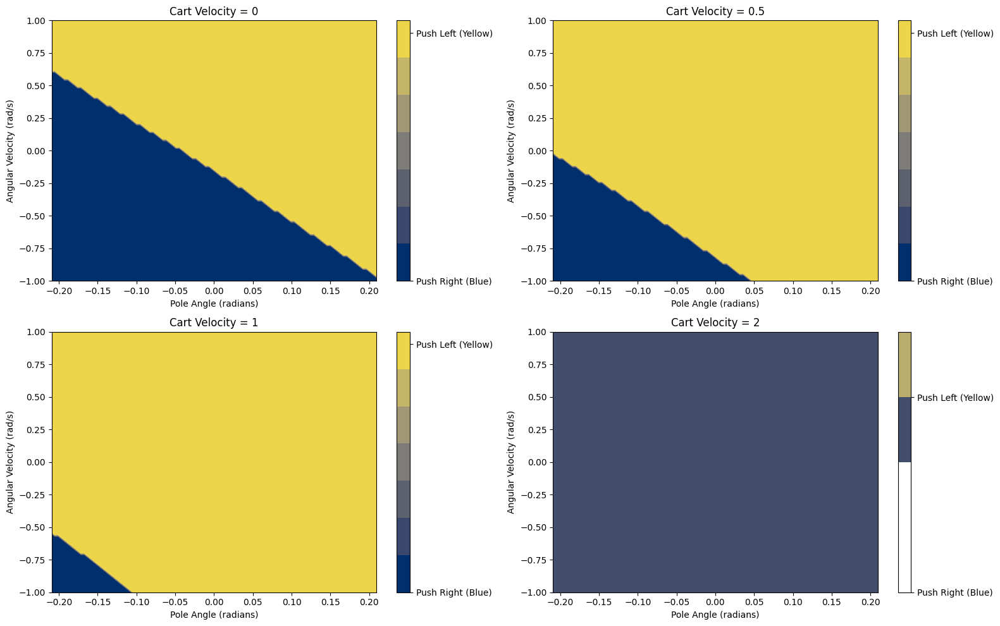

In [ ]:
import torch
import matplotlib.pyplot as plt

# Assuming `policy_net` is your trained DQN model
# layers = [4] + [A]*B + [2]
# # policy_net = DQN(layers)  # Load your trained model here
curr_policy = load_policy
# Define ranges for the pole angle and angular velocity
angle_range = 0.2094  # Maximum angle in radians (approx 24 degrees)
omega_range = 1     # Maximum angular velocity

# Number of samples for angle and angular velocity
angle_samples = 100
omega_samples = 100

angles = torch.linspace(-angle_range, angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

# Fix the cart position and visualize for different cart velocities
cart_velocities = [0, 0.5, 1, 2]

# Create a 2x2 grid for subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

for idx, cart_velocity in enumerate(cart_velocities):
    # Array to store the greedy policy (action) for each (angle, omega) pair
    policy_array = torch.zeros((angle_samples, omega_samples))
    
    # Evaluate the greedy policy
    for i, angle in enumerate(angles):
        for j, omega in enumerate(omegas):
            state = torch.tensor([0., cart_velocity, angle, omega])
            # print("state", state)
            with torch.no_grad():
                q_vals = curr_policy(state)
                # print("q_vals", q_vals)
                greedy_action = q_vals.argmax()
                policy_array[i, j] = greedy_action
    
    # Plot the greedy policy for the current cart velocity
    ax = axes[idx]
    contour = ax.contourf(angles, omegas, policy_array.T, cmap='cividis')
    ax.set_title(f"Cart Velocity = {cart_velocity}")
    ax.set_xlabel("Pole Angle (radians)")
    ax.set_ylabel("Angular Velocity (rad/s)")
    
    # Add a color bar to specify action meanings
    cbar = plt.colorbar(contour, ax=ax)
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Push Right (Blue)', 'Push Left (Yellow)'])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [12]:
import torch
import matplotlib.pyplot as plt

# Assuming `policy_net` is your trained DQN model
# layers = [4] + [A]*B + [2]
# # policy_net = DQN(layers)  # Load your trained model here
curr_policy = load_policy
# Define ranges for the pole angle and angular velocity
angle_range = 0.2095  # Maximum angle in radians (approx 24 degrees) 0.418
omega_range = 1     # Maximum angular velocity

# Number of samples for angle and angular velocity
angle_samples = 100
omega_samples = 100

angles = torch.linspace(-angle_range, angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

# Fix the cart position and visualize for different cart velocities
cart_velocities = [0, 0.5, 1, 2]

index_num = ["i", "ii", "iii", "iv"]
# Create a 2x2 grid for subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10), dpi=600)
axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

for idx, cart_velocity in enumerate(cart_velocities):
    # Array to store the greedy policy (action) for each (angle, omega) pair
    policy_array = torch.zeros((angle_samples, omega_samples))
    
    # Evaluate the greedy policy
    for i, angle in enumerate(angles):
        for j, omega in enumerate(omegas):
            state = torch.tensor([0., cart_velocity, angle, omega])
            # print("state", state)
            with torch.no_grad():
                q_vals = curr_policy(state)
                # print("q_vals", q_vals)
                greedy_action = q_vals.argmax()
                print("greedy_action", greedy_action)
                policy_array[i, j] = greedy_action
    
    # Plot the greedy policy for the current cart velocity
    ax = axes[idx]
    contour = ax.contourf(angles, omegas, policy_array.T, cmap='cividis')
    ax.set_title(f"({index_num[idx]}) Greedy Policy (Cart Velocity = {cart_velocity} m/s)", fontweight='bold', fontsize=14)
    ax.set_xlabel("Pole Angle (radians)", fontweight='bold', fontsize=14)
    ax.set_ylabel("Angular Velocity (rad/s)", fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=13)
    # Add a color bar to specify action meanings
    cbar = plt.colorbar(contour, ax=ax)
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Push Left (Blue)', 'Push Right (Yellow)'], fontweight='bold', fontsize=14)

# Adjust layout for better spacing
plt.subplots_adjust(hspace=0.25, wspace=0.25)
plt.tight_layout()
plt.show()

greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action tensor(0)
greedy_action te

In [19]:
# cart_velocities = [0, 0.5, 1, 2]

# index_num = ["i", "ii", "iii", "iv"]
# # Create a 2x2 grid for subplots
# fig, axes = plt.subplots(2, 2, figsize=(16, 10), dpi=600)
# axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

# for idx, cart_velocity in enumerate(cart_velocities):
#     # Array to store the greedy policy (action) for each (angle, omega) pair
#     policy_array = torch.zeros((angle_samples, omega_samples))
    
#     # Evaluate the greedy policy
#     for i, angle in enumerate(angles):
#         for j, omega in enumerate(omegas):
#             state = torch.tensor([0., cart_velocity, angle, omega])
#             # print("state", state)
#             with torch.no_grad():
#                 q_vals = curr_policy(state)
#                 # print("q_vals", q_vals)
#                 greedy_action = q_vals.argmax()
#                 policy_array[i, j] = greedy_action
    
#     # Plot the greedy policy for the current cart velocity
#     ax = axes[idx]
#     contour = ax.contourf(angles, omegas, policy_array.T, cmap='cividis')
#     ax.set_title(f"{index_num[idx]} Greedy Policy (Cart Velocity = {cart_velocity} m/s)", fontweight='bold', fontsize=14)
#     ax.set_xlabel("Pole Angle (radians)", fontweight='bold', fontsize=14)
#     ax.set_ylabel("Angular Velocity (rad/s)", fontweight='bold', fontsize=14)
    
#     # Add a color bar to specify action meanings
#     cbar = plt.colorbar(contour, ax=ax)
#     cbar.set_ticks([0, 1])
#     cbar.set_ticklabels(['Push Left (Blue)', 'Push Right (Yellow)'], fontweight='bold', fontsize=14)

# # Adjust layout for better spacing
# plt.tight_layout()
# plt.show()


# Define ranges for the pole angle and angular velocity
angle_range = 0.418  # Maximum angle in radians (approx 24 degrees)
omega_range = 1     # Maximum angular velocity

# Number of samples for angle and angular velocity
angle_samples = 100
omega_samples = 100

angles = torch.linspace(-angle_range, angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

# Fix the cart position and visualize for different cart velocities
cart_velocities = [0, 0.5, 1, 2]

index_num = ["i", "ii", "iii", "iv"]
# Create a 2x2 grid for subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10), dpi=600)
axes = axes.flatten()  # Flatten the 2x2 array for easier indexing

for idx, cart_velocity in enumerate(cart_velocities):
    # Array to store the greedy Q-values for each (angle, omega) pair
    q_value_array = torch.zeros((angle_samples, omega_samples))
    greedy_q_array = torch.zeros((angle_samples, omega_samples))
    # Evaluate the greedy Q-values
    for i, angle in enumerate(angles):
        for j, omega in enumerate(omegas):
            state = torch.tensor([0., cart_velocity, angle, omega])
            with torch.no_grad():
                q_vals = curr_policy(state)
                greedy_action = q_vals.argmax()
                greedy_q_array[i, j] = q_vals[greedy_action]
                #q_value_array[i, j] = q_vals[greedy_action]
    
    # Plot the greedy Q-values for the current cart velocity
    ax = axes[idx]
    contour = ax.contourf(angles, omegas, greedy_q_array.T, cmap='cividis', levels=100)
    ax.set_title(f"({index_num[idx]}) Greedy Q-values (Cart Velocity = {cart_velocity} m/s)", fontweight='bold', fontsize=14)
    ax.set_xlabel("Pole Angle (radians)", fontweight='bold', fontsize=14)
    ax.set_ylabel("Angular Velocity (rad/s)", fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=14)
    # Add a color bar to specify Q-value meanings
    cbar = plt.colorbar(contour, ax=ax)
    cbar.set_label('Greedy Q-values', fontweight='bold', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    cbar.set_label('Greedy Q-values', labelpad=15)

# Adjust layout for better spacing
plt.subplots_adjust(hspace=0.25, wspace=0.25)
plt.tight_layout()
plt.show()

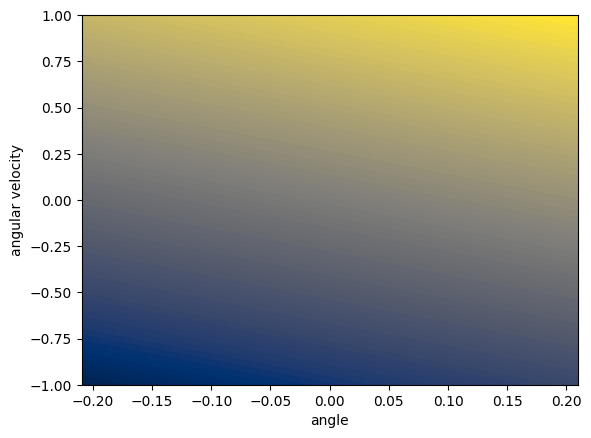

In [60]:
# Visualising the greedy Q-values for a stationary cart in the middle of the track
# 2D plot showing policy as a function of pole angle and angular velocity (omega)

# This plots the policy and Q values according to the network currently
# stored in the variable "policy_net"

# All visualisations provided here are placeholders and you can freely modify these plots and code

# Make sure to include appropriate labels and/or legends when presenting your plot

policy_net = DQN([4,2])   # randomly initialised, replace with your trained DQN
q = True    # whether q values or greedy policy is visualised

angle_range = .2095 # you may modify this range
omega_range = 1     # you may modify this range

angle_samples = 100
omega_samples = 100
angles = torch.linspace(angle_range, -angle_range, angle_samples)
omegas = torch.linspace(-omega_range, omega_range, omega_samples)

greedy_q_array = torch.zeros((angle_samples, omega_samples))
policy_array = torch.zeros((angle_samples, omega_samples))
for i, angle in enumerate(angles):
    for j, omega in enumerate(omegas):
        state = torch.tensor([0., 0., angle, omega])
        with torch.no_grad():
            q_vals = policy_net(state)
            greedy_action = q_vals.argmax()
            greedy_q_array[i, j] = q_vals[greedy_action]
            policy_array[i, j] = greedy_action
if q:
    plt.contourf(angles, omegas, greedy_q_array.T, cmap='cividis', levels=100)
else:
    plt.contourf(angles, omegas, policy_array.T, cmap='cividis')
plt.xlabel("angle")
plt.ylabel("angular velocity")
plt.show()